In [1]:
import holopy as hp
from holopy.scattering import Scatterer, Sphere, calc_holo
from holopy.scattering.scatterer import Indicators
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import pandas as pd
import json
from pylorenzmie.theory import coordinates, LMHologram
from pylorenzmie.analysis.Feature import Feature
from holopy.scattering.theory import DDA

In [2]:
font = {'size'   : 16}

matplotlib.rc('font', **font)

In [3]:
#Instrument parameters:
wv = 0.447
mag = 0.120
n_m = 1.34 #assume water

In [4]:
def bound_spheres(a_p, n_p, a_1, n_1, z_p):
    #generates holograms with a single coating and double coating 
    detector = hp.detector_grid(200, mag)
    center = (mag*100, mag*100, z_p)
    sphere = Sphere(r = a_p, center = (0, 0, 0))

    dda = DDA()
    spacing = dda.required_spacing(wv, n_m, n_p)
    
    r_sum1 = a_1 + a_p
    
    indicators_sphere = Indicators([sphere.contains], 
                                   [[-r_sum1, r_sum1], [-r_sum1, r_sum1], [-r_sum1, r_sum1]])
    
    sphere_scatterer = Scatterer(indicators_sphere,
                     n_p, center)
    
    holo = np.squeeze(calc_holo(detector, sphere_scatterer, medium_index=n_m, illum_wavelen=wv, illum_polarization=(1, 0)
                                , theory = dda
                                #, theory = 'auto'
                               ).data)
    

    binding1 = Sphere(r = r_sum1, center = (0, 0, 0))
    
    def coating1(point):
        return(np.logical_and(binding1.contains(point),
           np.logical_not(sphere.contains(point))))

    indicators_single = Indicators([sphere.contains, coating1],
                        [[-r_sum1, r_sum1], [-r_sum1, r_sum1], [-r_sum1, r_sum1]])
    

    single_scatterer = Scatterer(indicators_single,
                     (n_p, n_1), center)
    
    single_holo = np.squeeze(calc_holo(detector, single_scatterer, medium_index=n_m, illum_wavelen=wv, illum_polarization=(1, 0)
                                      , theory = dda
                                      ).data)
    
    return holo, single_holo

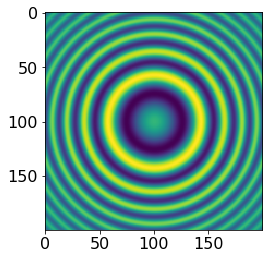

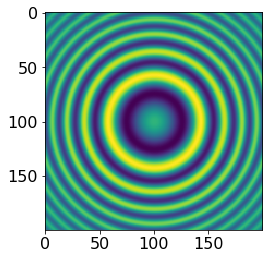

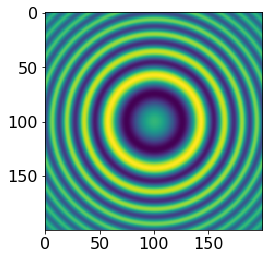

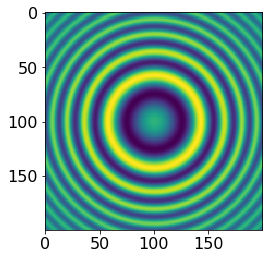

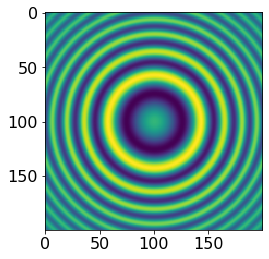

...

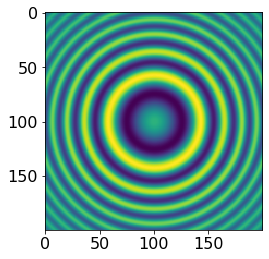

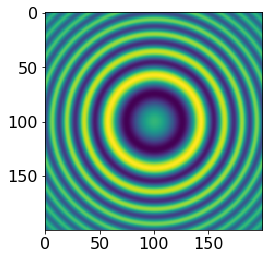

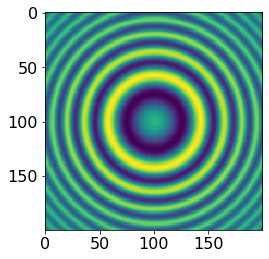

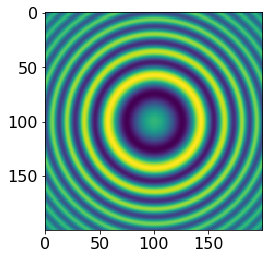

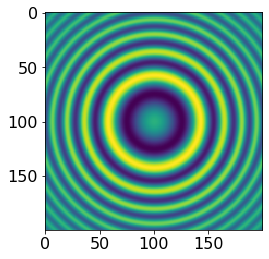

In [5]:
a_p = 0.5 #um
n_p = 1.6 #polystyrene
z_p = 50

a_1_range = [0.005, 0.02]
n_1_range = [1.4, 1.7]

num_to_sample = 50

#a_p_samples = np.linspace(a_p_range[0], a_p_range[1], num = num_to_sample)

samples = {'z_p': z_p, 'a_p': a_p, 'n_p': n_p, 'a_1': [], 'n_1': [], 'data0': [], 'data1': []}

for i in range(num_to_sample):
    a_1 = np.random.uniform(low=a_1_range[0], high=a_1_range[1])
    n_1 = np.random.uniform(low=n_1_range[0], high=n_1_range[1])
    data0, data1 = bound_spheres(a_p, n_p, a_1, n_1, z_p)
    plt.imshow(data0)
    plt.show()
    plt.imshow(data1)
    plt.show()
    samples['a_1'].append(a_1)
    samples['n_1'].append(n_1)
    samples['data0'].append(data0.tolist())
    samples['data1'].append(data1.tolist())
    
    print(i, ' completed', end='\r')

Set up pylorenzmie fitting pipeline

In [6]:
feature = Feature(model=LMHologram())
shape = [200, 200]
feature.model.coordinates = coordinates(shape, dtype=np.float32)
ins = feature.model.instrument
ins.wavelength = wv
ins.magnification = mag
ins.n_m = n_m

p = feature.model.particle
p.r_p = [shape[0]//2, shape[1]//2, z_p/mag]

feature.optimizer.mask.settings['distribution'] = 'fast'
feature.optimizer.mask.settings['percentpix'] = .1
feature.model.coordinates = coordinates(shape, dtype=np.float32)
feature.model.double_precision = False

In [7]:
#parameters that pylorenzmie will fit to
samples['a_p*0'] = [] 
samples ['n_p*0'] = []
samples['a_p*1'] = [] 
samples ['n_p*1'] = []

for n in range(len(samples['data0'])):
    #plt.imshow(np.array(samples['data0'][n]))
    #plt.show()
    p = feature.model.particle
    
    #fit 1:  core sphere
    p.r_p = [shape[0]//2, shape[1]//2, z_p/mag]
    p.a_p = samples['a_p']
    p.n_p = samples['n_p']
    feature.data = np.array(samples['data0'][n])
    result = feature.optimize(method='lm', verbose=False)
    print(result)
    a_fit = feature.model.particle.a_p
    n_fit = feature.model.particle.n_p
    
    samples['a_p*0'].append(a_fit)
    samples['n_p*0'].append(n_fit)
    
    #fit 2:  single coating
    p.r_p = [shape[0]//2, shape[1]//2, z_p/mag]
    p.a_p = samples['a_p']
    p.n_p = samples['n_p']
    feature.data = np.array(samples['data1'][n])
    result = feature.optimize(method='lm', verbose=False)
    print(result)
    a_fit = feature.model.particle.a_p
    n_fit = feature.model.particle.n_p
    
    samples['a_p*1'].append(a_fit)
    samples['n_p*1'].append(n_fit)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005847767033980929
nfev: 19
x_p: 99.98275 (init: 100.00000)
y_p: 99.98479 (init: 100.00000)
z_p: 416.40640 (init: 416.66667)
a_p: 0.49973 (init: 0.50000)
n_p: 1.59479 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006161528133894434
nfev: 19
x_p: 99.98078 (init: 100.00000)
y_p: 99.98421 (init: 100.00000)
z_p: 416.39411 (init: 416.66667)
a_p: 0.50794 (init: 0.50000)
n_p: 1.59411 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.1200

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005577372571303371
nfev: 19
x_p: 99.86830 (init: 100.00000)
y_p: 99.87021 (init: 100.00000)
z_p: 416.54877 (init: 416.66667)
a_p: 0.51872 (init: 0.50000)
n_p: 1.59493 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005986908172342615
nfev: 19
x_p: 99.98610 (init: 100.00000)
y_p: 99.99148 (init: 100.00000)
z_p: 416.42130 (init: 416.66667)
a_p: 0.49955 (init: 0.50000)
n_p: 1.59495 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.1200

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006015748976035192
nfev: 25
x_p: 99.94974 (init: 100.00000)
y_p: 99.95138 (init: 100.00000)
z_p: 416.45062 (init: 416.66667)
a_p: 0.50877 (init: 0.50000)
n_p: 1.59455 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: Both `ftol` and `xtol` termination conditions are satisfied.
redchi: 0.000631703332160729
nfev: 25
x_p: 99.98867 (init: 100.00000)
y_p: 99.99188 (init: 100.00000)
z_p: 416.38776 (init: 416.66667)
a_p: 0.49942 (init: 0.50000)
n_p: 1.59503 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magn

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.000614077083379273
nfev: 19
x_p: 99.91022 (init: 100.00000)
y_p: 99.90967 (init: 100.00000)
z_p: 416.52380 (init: 416.66667)
a_p: 0.50041 (init: 0.50000)
n_p: 1.59450 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006123774374155329
nfev: 19
x_p: 99.90808 (init: 100.00000)
y_p: 99.91089 (init: 100.00000)
z_p: 416.52643 (init: 416.66667)
a_p: 0.50587 (init: 0.50000)
n_p: 1.59446 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0006099611883705825
nfev: 19
x_p: 99.97667 (init: 100.00000)
y_p: 99.97809 (init: 100.00000)
z_p: 416.42250 (init: 416.66667)
a_p: 0.50815 (init: 0.50000)
n_p: 1.59427 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.12000 (init: 0.12000) (fixed)
alpha: 1.00000 (init: 1.00000) (fixed)

FIT REPORT
---------------------------------------------
method: lm
success: True
message: `ftol` termination condition is satisfied.
redchi: 0.0005895798370037828
nfev: 19
x_p: 99.94365 (init: 100.00000)
y_p: 99.94607 (init: 100.00000)
z_p: 416.47027 (init: 416.66667)
a_p: 0.49962 (init: 0.50000)
n_p: 1.59482 (init: 1.60000)
k_p: 0.00000 (init: 0.00000) (fixed)
n_m: 1.34000 (init: 1.34000) (fixed)
wavelength: 0.44700 (init: 0.44700) (fixed)
magnification: 0.1200

In [8]:
savesamples = samples.copy()
del savesamples['data0']
del savesamples['data1'] #omit data column to save space

with open('./singlecoat_a_1_n_1_randomized.json', 'w') as f:
    json.dump(savesamples, f)

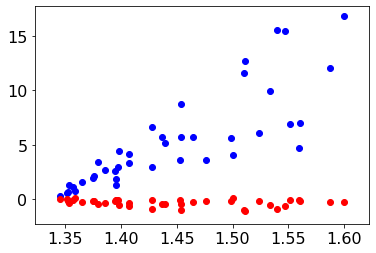

In [10]:
df = pd.DataFrame(savesamples)
#print(df)

n_1 = df.n_1

delta_a = 1e3*(df['a_p*1'] - df['a_p*0'])
delta_n = 1e3*(df['n_p*1'] - df['n_p*0'])

#linear regression
#m, b = np.polyfit(a_1, delta_a, 1)
#fit_delta_a = [x*m + b for x in a_1]

#m_str = '%.2f'%m
#b_str = '%.2f'%b

fig, ax = plt.subplots()
ax.scatter(n_1, delta_a, c='b')
ax.scatter(n_1, delta_n, c='r')
#ax.plot(n_1, fit_delta_a, c='r')
#ax.set_xlabel(r'Coating length $a_1$ [nm]')
#ax.set_ylabel(r'Difference in fits $\Delta a_p^*$ [nm]')
#ax.text(6, 24, r'$\Delta a_p^* = {} a_1 + {}$'.format(m_str, b_str))
plt.show()



#fig.savefig('')

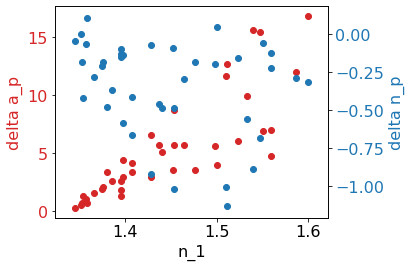

In [11]:
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('n_1')
ax1.set_ylabel('delta a_p', color=color)
ax1.scatter(n_1, delta_a, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('delta n_p', color=color)  # we already handled the x-label with ax1
ax2.scatter(n_1, delta_n, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

#fig.savefig()